In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, LearningRateScheduler
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input





import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import json

2024-03-17 17:58:42.342647: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-17 17:58:42.342812: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-17 17:58:42.499883: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


         image_id  label                              disease
0  1000015157.jpg      0       Cassava Bacterial Blight (CBB)
1  1000201771.jpg      3         Cassava Mosaic Disease (CMD)
2   100042118.jpg      1  Cassava Brown Streak Disease (CBSD)
3  1000723321.jpg      1  Cassava Brown Streak Disease (CBSD)
4  1000812911.jpg      3         Cassava Mosaic Disease (CMD)


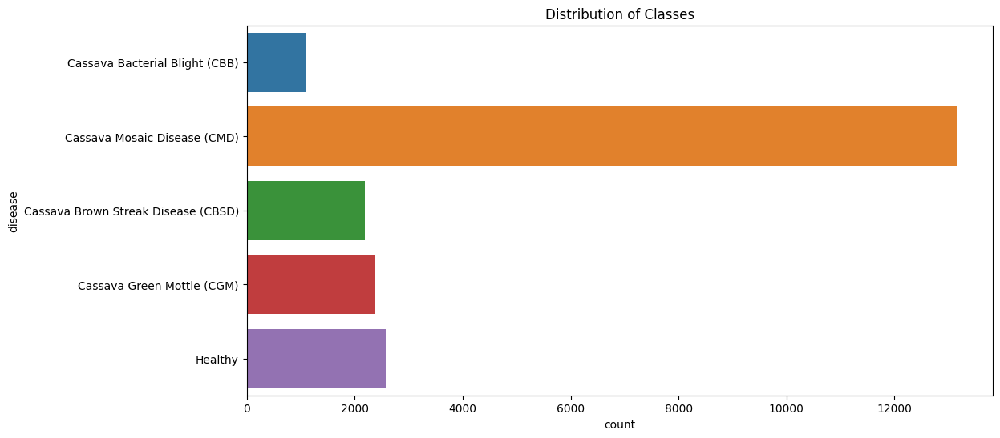

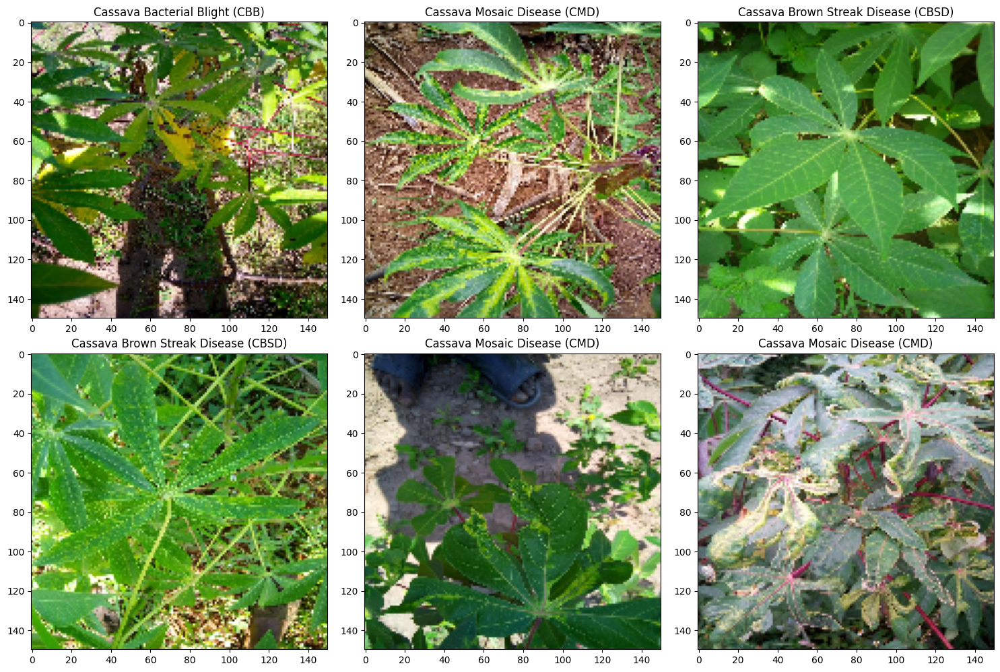

In [3]:
# Load dataset
train_df = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')

# Load label map
with open('/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    label_map = json.load(file)

# Convert label ids to disease names
train_df['disease'] = train_df['label'].astype(str).map(label_map)

# Display the first few rows
print(train_df.head())

# Visualization
plt.figure(figsize=(12, 6))
sns.countplot(y='disease', data=train_df)
plt.title('Distribution of Classes')
plt.show()

# Display some images
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
for i, ax in enumerate(axs.flatten()):
    img = load_img(f"/kaggle/input/cassava-leaf-disease-classification/train_images/{train_df.iloc[i]['image_id']}", target_size=(150, 150))
    ax.imshow(img)
    ax.set_title(train_df.iloc[i]['disease'])
plt.tight_layout()

In [4]:
# Data Preparation
train_df = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')
train_df['label'] = train_df['label'].astype(str)  # Convert 'label' to string

# Load test data
test_df = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/sample_submission.csv')

# Set up directories
train_dir = '/kaggle/input/cassava-leaf-disease-classification/train_images'
test_dir = '/kaggle/input/cassava-leaf-disease-classification/test_images'

# Split the dataset
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

# Define Data Generators with Preprocessing for ResNet50
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,  # Use ResNet50 preprocessing
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

val_datagen = ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)  # Use ResNet preprocessing

# Create Data Generators
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col="image_id",
    y_col="label",
    target_size=(224, 224), 
    batch_size=32,
    class_mode='sparse')

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=train_dir,
    x_col="image_id",
    y_col="label",
    target_size=(224, 224),  
    batch_size=32,
    class_mode='sparse')

Found 17117 validated image filenames belonging to 5 classes.
Found 4280 validated image filenames belonging to 5 classes.


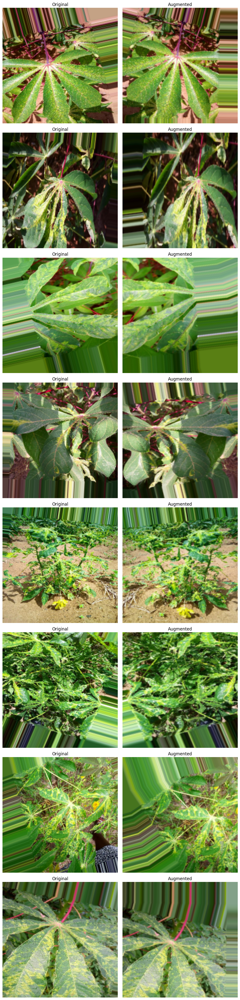

In [5]:
# Fetch a batch of images
x_batch, y_batch = next(train_generator)

# Function to reverse preprocessing for visualization
def reverse_resnet_preprocessing(img):
    # ResNet50 uses mean subtraction based on ImageNet means for each channel
    mean = np.array([103.939, 116.779, 123.68])  # BGR
    img = img + mean
    img = np.clip(img, 0, 255).astype('uint8')
    img = img[..., ::-1]  # Convert BGR to RGB
    return img


# Plot
fig, ax = plt.subplots(8, 2, figsize=(10, 40))  # Adjusted for 8 pairs of images
ax = ax.ravel()

for i in range(8):
    # Original Image
    img_original = reverse_resnet_preprocessing(x_batch[i])
    ax[2*i].imshow(img_original)
    ax[2*i].set_title('Original')
    ax[2*i].axis('off')
    
    # Augmented Image
    img_aug = train_datagen.random_transform(x_batch[i])
    img_aug = reverse_resnet_preprocessing(img_aug)
    ax[2*i+1].imshow(img_aug)
    ax[2*i+1].set_title('Augmented')
    ax[2*i+1].axis('off')

plt.tight_layout()
plt.show()

In [6]:
base_model = tf.keras.applications.ResNet50(
    weights='imagenet', 
    include_top=False, 
    input_shape=(224, 224, 3))

base_model.trainable = False
# Freeze the initial layers
# for layer in base_model.layers[:4]:
#     layer.trainable = True

x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
# x = Dense(1024, activation='relu', kernel_regularizer=l2(0.4))(x)
# x = Dropout(0.5)(x)
# x = Dense(512, activation='relu', kernel_regularizer=l2(0.4))(x)
# x = Dropout(0.5)(x)
predictions = tf.keras.layers.Dense(5, activation='softmax')(x)  # 5 classes for cassava diseases

model = tf.keras.Model(inputs=base_model.input, outputs=predictions)

model.compile(loss='sparse_categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), metrics=['accuracy'])

print(model.summary())


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,597,957 (90.02 MB)

 Trainable params: 10,245 (40.02 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

None


In [7]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',  # monitor the validation loss
    patience=10, #number of epochs with no improvement the learning rate will be reduced
    verbose=1,    # number of epochs with no improvement after which training will be stopped
    restore_best_weights=True)  # restore model weights from the epoch with the best value of the monitored quantity

Learning rate schedule: 1e-05 to 0.0001 to 8.72e-05


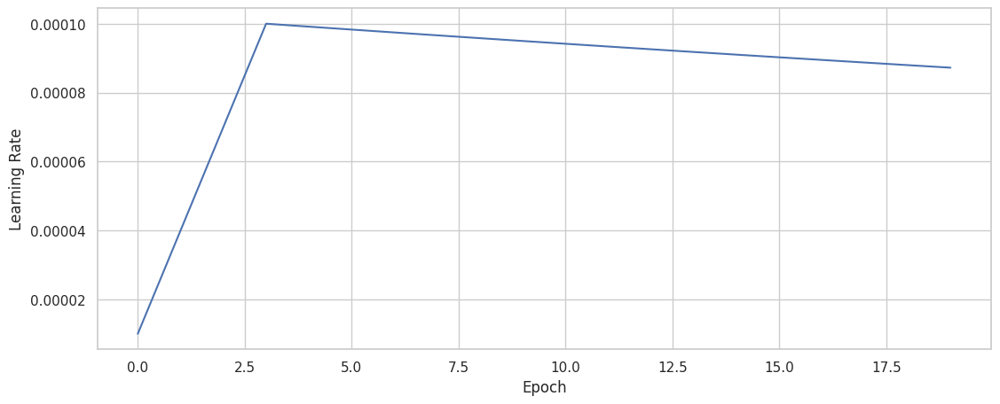

In [8]:
epochs =20
EPOCHS =epochs

LR_START = 0.00001
LR_MAX = 0.0001
LR_MIN = 0.00001
LR_RAMPUP_EPOCHS = 3
LR_SUSTAIN_EPOCHS = 0
LR_EXP_DECAY = 0.85

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        progress = (epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) / (EPOCHS - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS)
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(progress) + LR_MIN
    return float(lr)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10,verbose=1, mode='auto',min_delta=0.0001, cooldown=0, min_lr=0)

#visualizing the learning rate schedule
rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]

sns.set(style='whitegrid')
plt.figure(figsize=(13, 5))
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [9]:
# Use a callback for learning rate scheduling //// avoiding overfitting and can be better convergence during training
# lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10,verbose=1, mode='auto',min_delta=0.0001, cooldown=0, min_lr=0)# min_lr: meaning there is no lower limit

In [10]:
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True)  # Save the best model

In [11]:
batch_size = 32

steps_per_epoch = train_generator.n // train_generator.batch_size
validation_steps = val_generator.n // val_generator.batch_size

history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=20,
    validation_data=val_generator,
    validation_steps=validation_steps,
    callbacks=[early_stopping,lr_scheduler, model_checkpoint],
    verbose=1
)

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


534/534 ━━━━━━━━━━━━━━━━━━━━ 1770s 3s/step - accuracy: 0.5932 - loss: 2.0016 - val_accuracy: 0.4798 - val_loss: 2.4408 - learning_rate: 0.0100
Epoch 2/20
  1/534 ━━━━━━━━━━━━━━━━━━━━ 21:54 2s/step - accuracy: 0.5000 - loss: 2.1703

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


534/534 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.5000 - loss: 1.0872 - val_accuracy: 0.5000 - val_loss: 0.7006 - learning_rate: 0.0100
Epoch 3/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 1766s 3s/step - accuracy: 0.6313 - loss: 1.8365 - val_accuracy: 0.7042 - val_loss: 1.9366 - learning_rate: 0.0100
Epoch 4/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - accuracy: 0.7188 - loss: 0.9081 - val_accuracy: 0.5833 - val_loss: 0.9675 - learning_rate: 0.0100
Epoch 5/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 1787s 3s/step - accuracy: 0.6337 - loss: 2.0180 - val_accuracy: 0.6856 - val_loss: 1.7519 - learning_rate: 0.0100
Epoch 6/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.5938 - loss: 1.1561 - val_accuracy: 0.6667 - val_loss: 1.0152 - learning_rate: 0.0100
Epoch 7/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 1721s 3s/step - accuracy: 0.6334 - loss: 2.0274 - val_accuracy: 0.6788 - val_loss: 1.6002 - learning_rate: 0.0100
Epoch 8/20
534/534 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - accuracy: 0.6562 - loss: 1.0981 - v

In [12]:
# Evaluation
print('Evaluation on training set:')
model.evaluate(train_generator)

print('Evaluation on validation set:')
model.evaluate(val_generator)

Evaluation on training set:
535/535 ━━━━━━━━━━━━━━━━━━━━ 1366s 3s/step - accuracy: 0.7110 - loss: 1.3508
Evaluation on validation set:
134/134 ━━━━━━━━━━━━━━━━━━━━ 325s 2s/step - accuracy: 0.6981 - loss: 1.7679


[1.7275344133377075, 0.6950934529304504]

134/134 ━━━━━━━━━━━━━━━━━━━━ 325s 2s/step - accuracy: 0.6920 - loss: 1.7290
Validation loss: 1.7233695983886719, validation accuracy: 0.6950934529304504


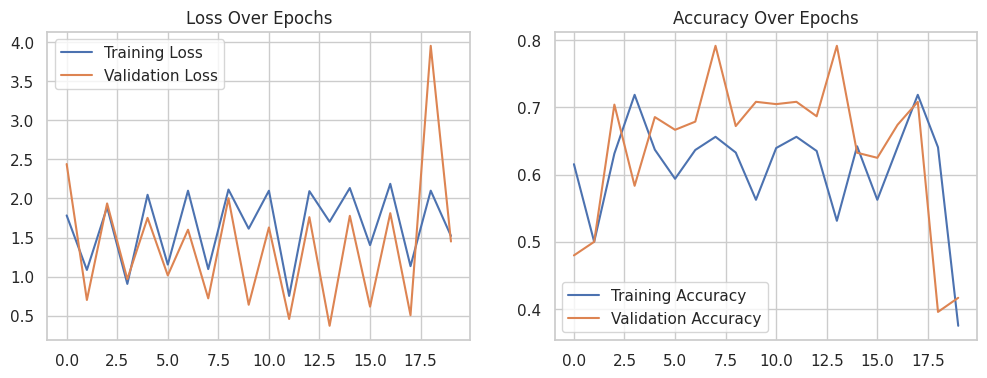

In [13]:
# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_generator)
print(f'Validation loss: {val_loss}, validation accuracy: {val_accuracy}')

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Over Epochs')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Over Epochs')

plt.show()

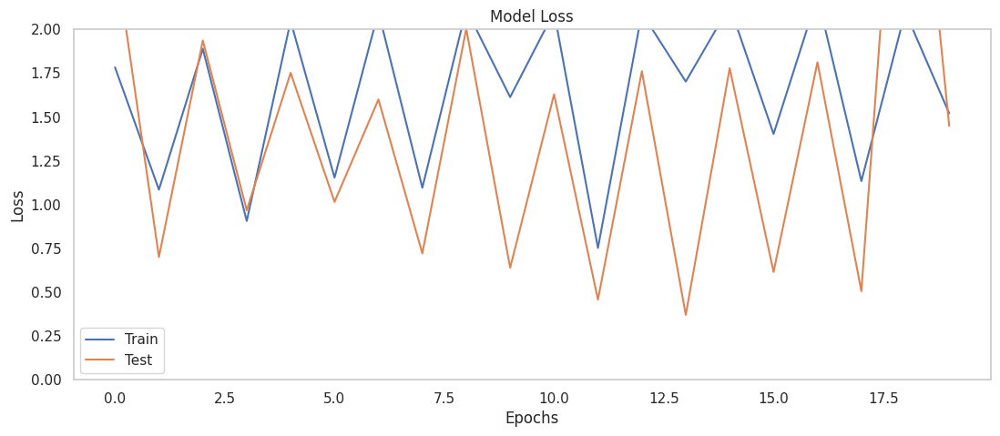

In [14]:
plt.figure(figsize=(13, 5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Model Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'])
plt.ylim(ymax = 2, ymin = 0)
plt.grid()
plt.show()

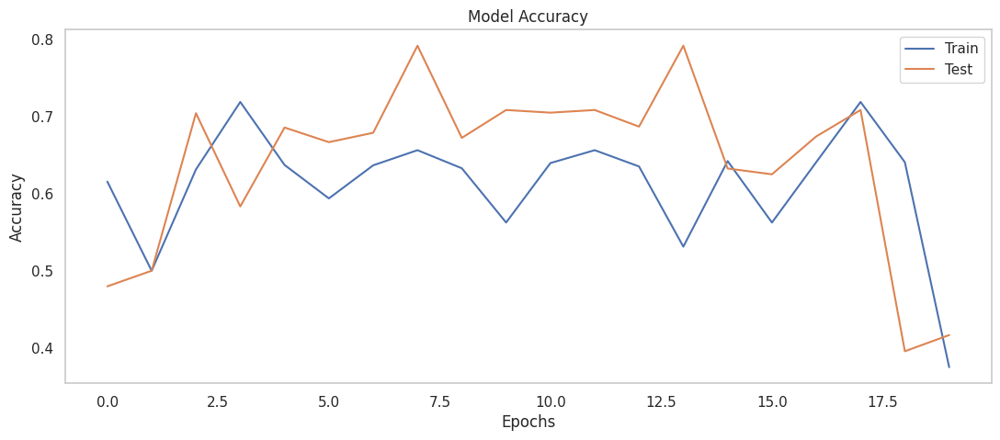

In [15]:
plt.figure(figsize=(13, 5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Train','Test'])
plt.grid()
plt.show()

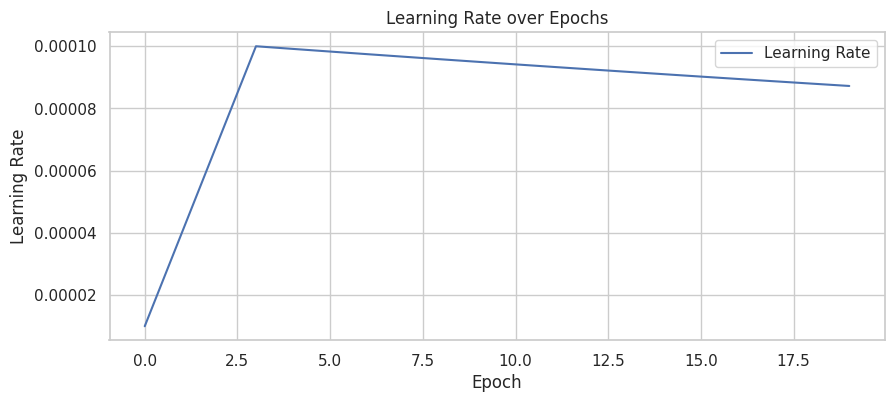

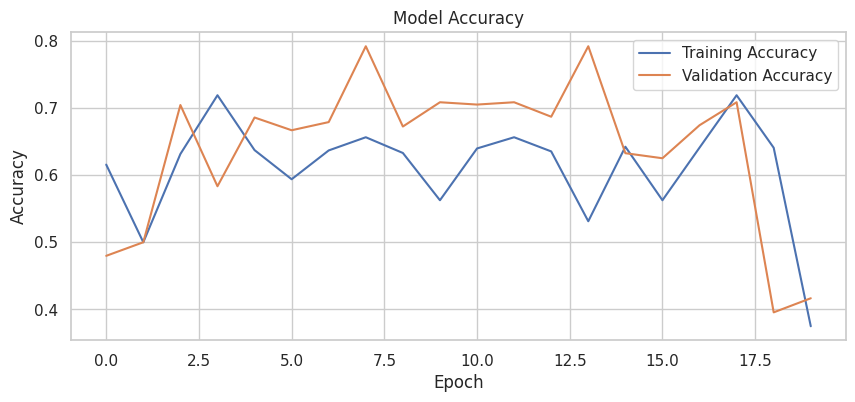

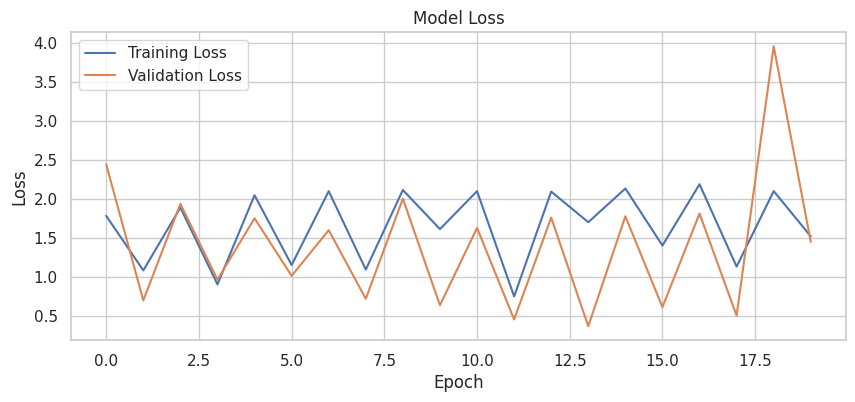

In [16]:
# Plotting learning rate
plt.figure(figsize=(10, 4))
plt.plot(history.epoch, [lrfn(epoch) for epoch in history.epoch], label='Learning Rate')
plt.title("Learning Rate over Epochs")
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.legend()
plt.grid(True)
plt.show()

# Plotting accuracy
plt.figure(figsize=(10, 4))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plotting loss
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()